In [ ]:
### This notebook goes through the process of creating the pipleine and using it

In [1]:
#pip install big-fish

import os
import bigfish
import bigfish.stack as stack
import bigfish.plot as plot
import bigfish.detection as detection
import bigfish.segmentation as segmentation
import bigfish.multistack as multistack
import bigfish.classification as classification
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics as s
from scipy import stats
from sklearn import linear_model
from pandas.plotting import scatter_matrix
from scipy.stats import mannwhitneyu


print("Big-FISH version: {0}".format(bigfish.__version__))

Big-FISH version: 0.6.2


/Users/bilalsyed/opt/anaconda3/lib/python3.9/site-packages/bigfish/segmentation/nuc_segmentation.py:16: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology.selem import disk


# I/O

In [2]:
### Data consists of 5 genes, each is divided into dates, which are stored as folders. I am working folder-by-folder

path_input = "/Users/bilalsyed/FISH/input"
folders = os.listdir(path_input)
folders.sort()
#print(folders)
folders = folders[1:-1]  # Ignore .DS_Store and 'others' folder
print(folders)

# Select folder
folder = folders[4]
print("\n\n"+folder)

files = os.listdir(os.path.join(path_input, folder, "dv"))
files.sort()
files = files[1:len(files)]    #.DS_Store
files

['BY_Atp4-GFP_20april', 'BY_Atp4-GFP_30June', 'BY_Atp4-GFP_30May', 'BY_Atp4-GFP_31May', 'BY_Gcv3-GFP_20april', 'BY_Gcv3-GFP_30June', 'BY_Gcv3-GFP_30May02', 'BY_Gcv3-GFP_31May', 'BY_Gcv3-GFP_31May12', 'BY_Hms2-GFP_10May07', 'BY_Hms2-GFP_22May07', 'BY_Tim17-GFP_06July', 'BY_Tim17-GFP_22april', 'BY_Tim17-GFP_31May', 'BY_Ura4-GFP_06July', 'BY_Ura4-GFP_22april']


BY_Gcv3-GFP_20april


['BY_Gcv3-GFP_GFPprobe_MW_13april_combo_02_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_03_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_04_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_05_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_06_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_07_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_08_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_09_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_10_R3D.dv',
 'BY_Gcv3-GFP_GFPprobe_MW_13april_combo_11_R3D.dv']

In [3]:
### Getting all the files from the gene-date set

rna = []
dapi = []
for f in files:
    path_dapi = os.path.join(path_input, folder, "dv", f)
    dv = stack.read_dv(path_dapi)
    rna.append(dv[:,0,:,:])
    dapi.append(dv[:,1,:,:])

print("No. of files in the folder: "+str(len(rna)))

No. of files in the folder: 10


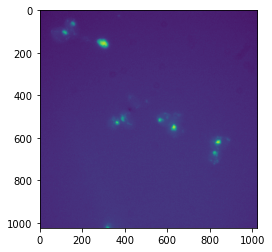

In [4]:
plt.imshow(dapi[0][11])

In [ ]:
### Create output directories

for i in range(len(folders)):

    out_path = "/Users/bilalsyed/FISH/output"

    # Creating output directory for gene
    os.mkdir(os.path.join(out_path,folders[i]))
    out_path = os.path.join(out_path,folders[i])
    print(out_path)

    # Creating output directories [spots, nucLabel, cellLabel, fov]
    os.mkdir(out_path+"/spots")
    os.mkdir(out_path+"/nucLabel")
    os.mkdir(out_path+"/cellLabel")
    os.mkdir(out_path+"/fov")

In [5]:
### Set the output path for the current folder so that we can begin working

out_path = "/Users/bilalsyed/FISH/output"
out_path = os.path.join(out_path,folder)
out_path

'/Users/bilalsyed/FISH/output/BY_Gcv3-GFP_20april'

# Pipeline start

##### Detect and save spots (skip if already done)

In [ ]:
### Run detect_spots() on list of all images in the folder

for i in range(len(rna)):
    spots, threshold = detection.detect_spots(
        images=rna[i],                       
        return_threshold=True, 
        voxel_size=(300, 103, 103),
        spot_radius=(350, 150, 150)) 

    print(threshold)

    # Saving all the spots
    stack.save_array(spots, os.path.join(out_path+"/spots", str(i).zfill(2)+"_spots"))

##### Read spots (skip if you ran the above cell)

In [6]:
a = os.listdir(out_path+"/spots")
a.sort(reverse=True)
a = a[0:len(rna)]                            # To get rid of .DS_Store file
a.sort()

spots = []
for i in range(len(rna)):
        spots.append(stack.read_array(os.path.join(out_path+"/spots", a[i])))

##### Plot the detected spots (to test)

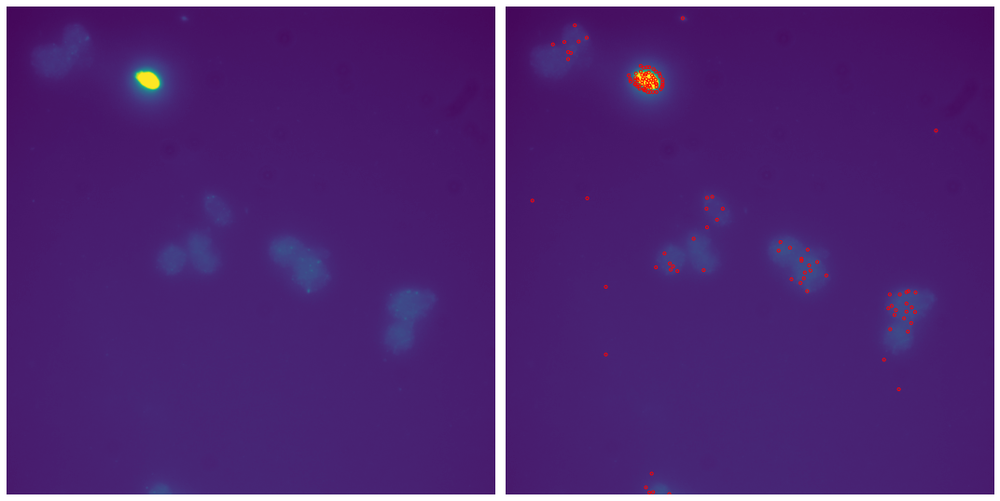

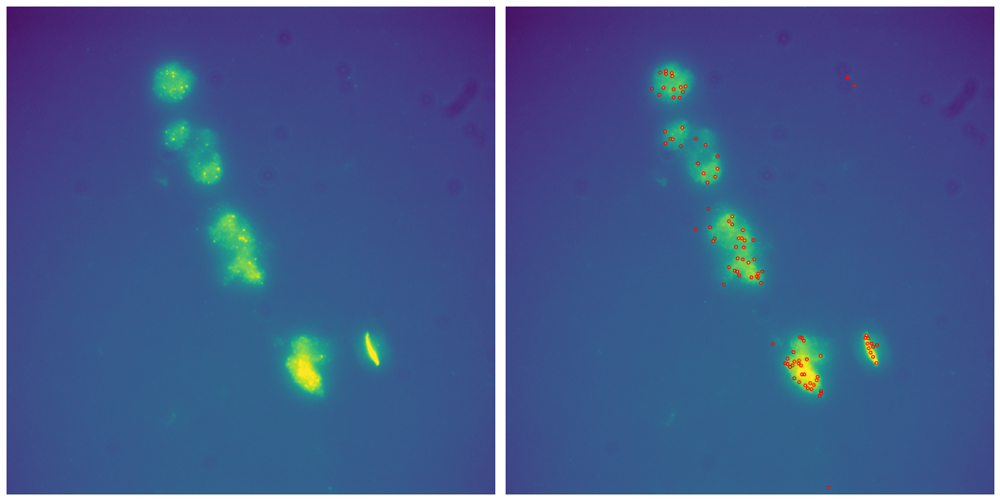

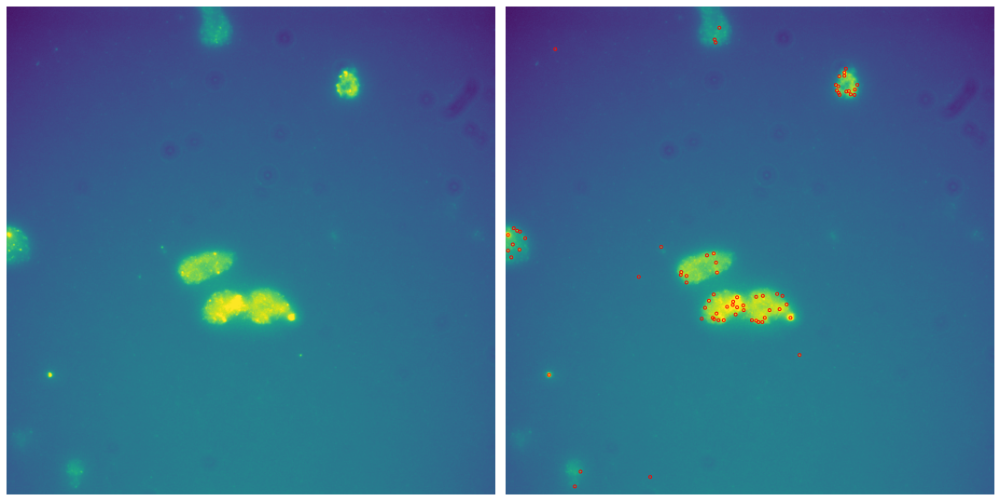

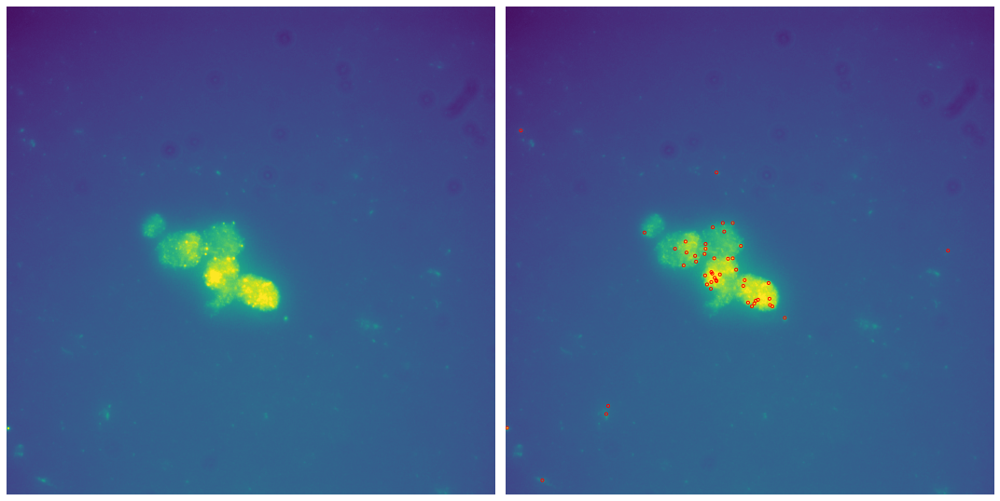

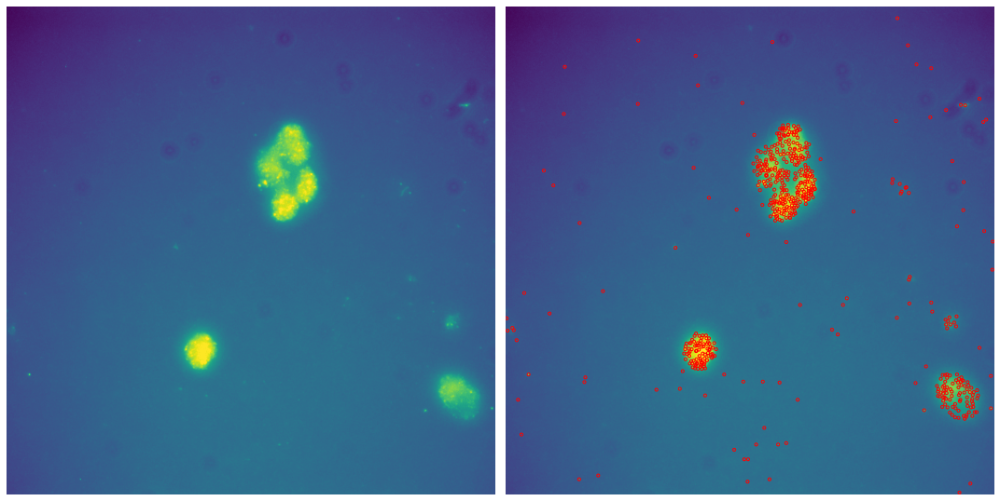

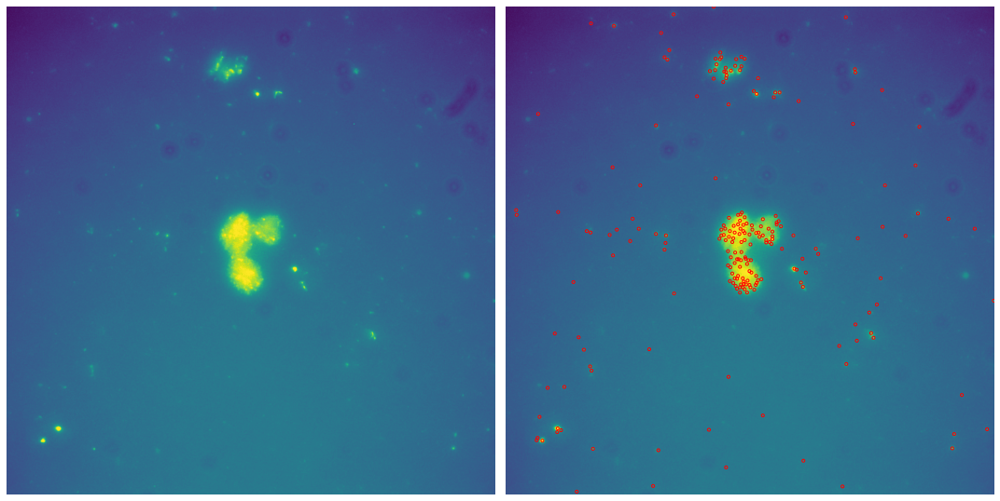

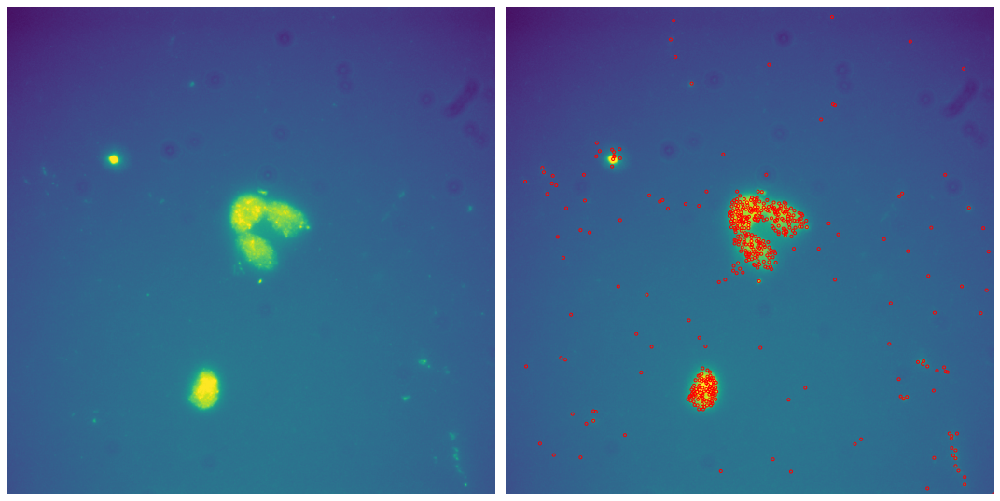

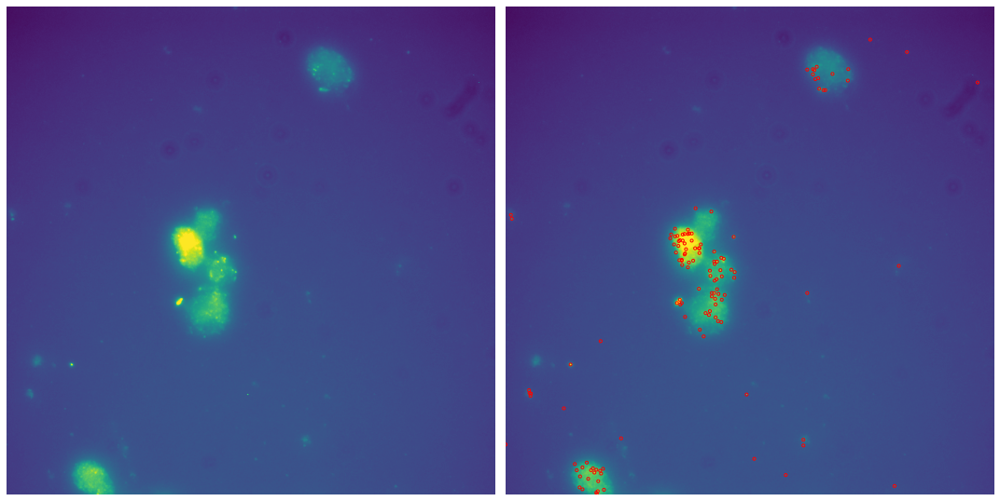

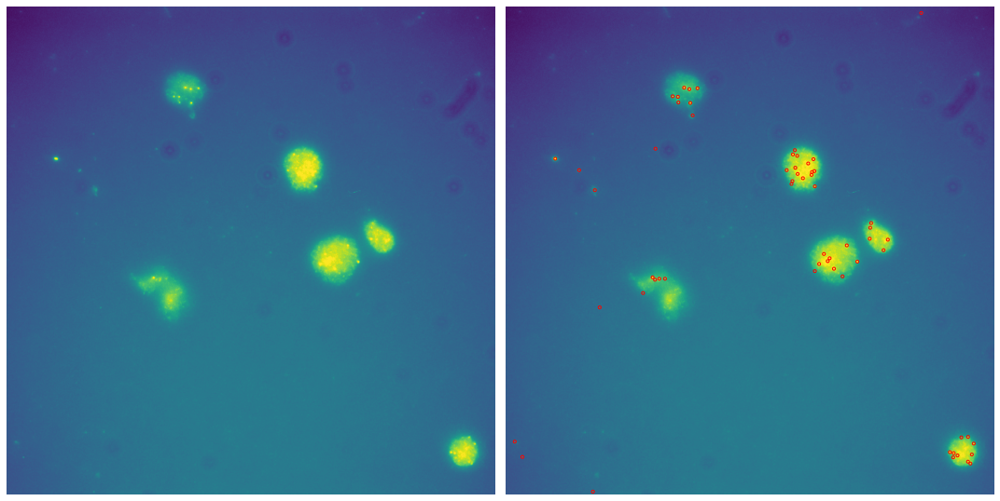

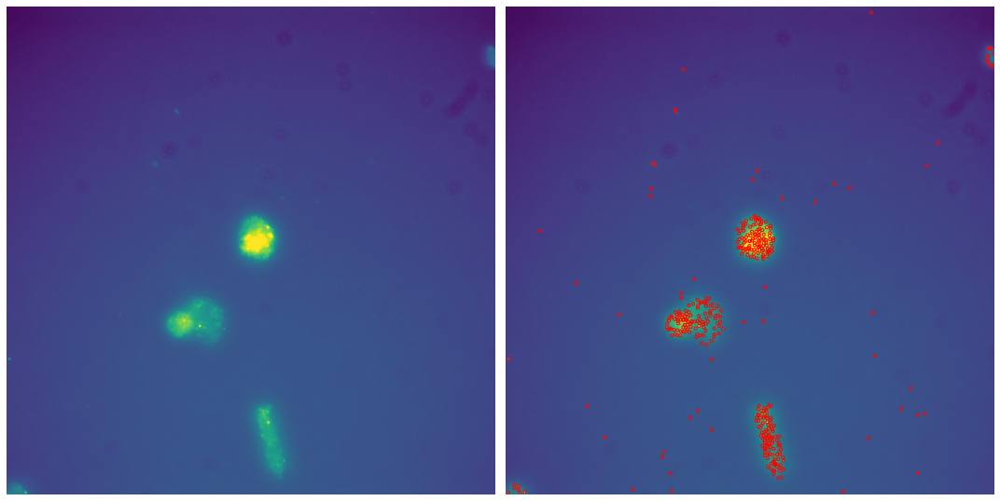

In [7]:
### Doesn't matter if loads of spots detected outside the cells
### Will be segmenting later and counting only within the cell (and nucleus) boundaries

for i in range(len(rna)):
    rna_mip = stack.maximum_projection(rna[i])
    plot.plot_detection(rna_mip, spots[i], contrast=True)

##### Segmentation (skip if already done)

0


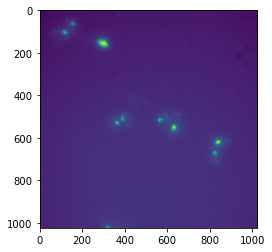

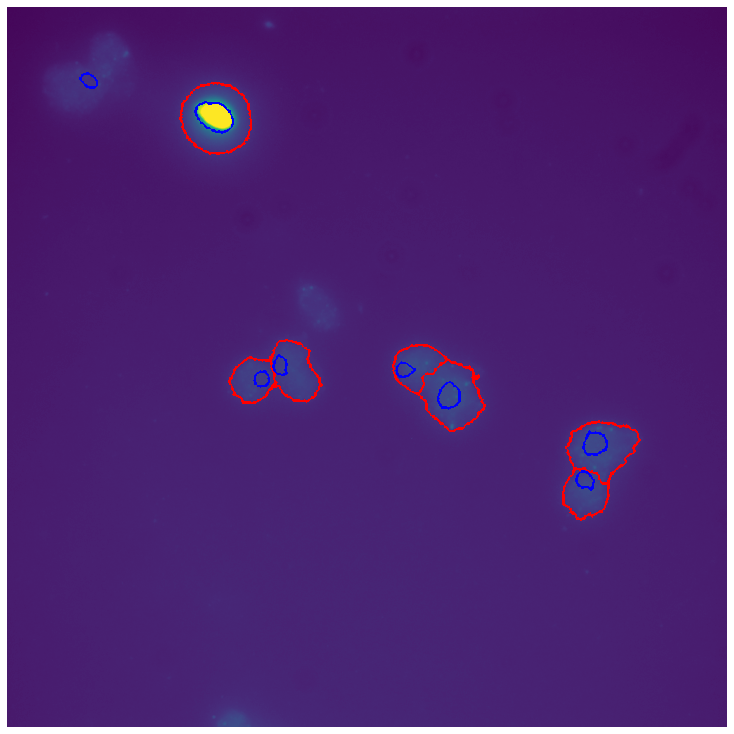

1


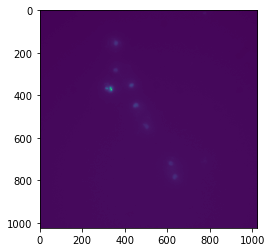

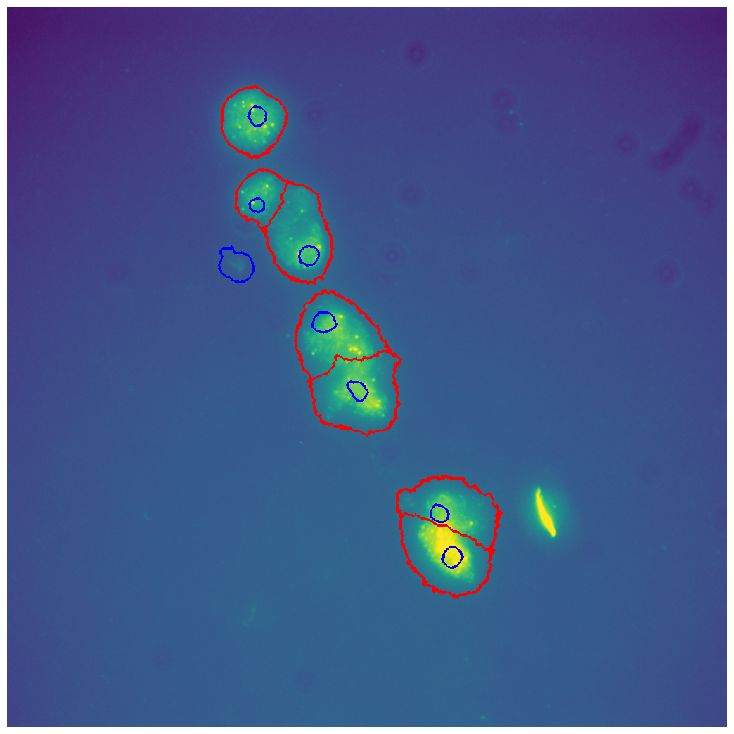

2


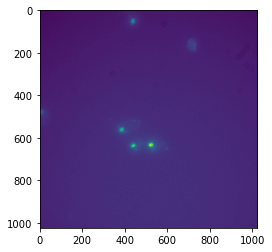

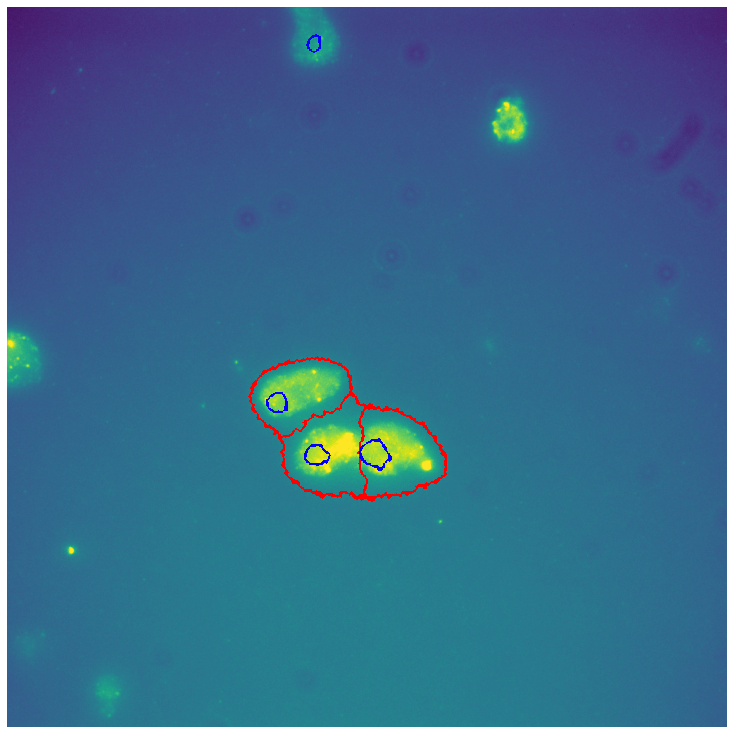

3


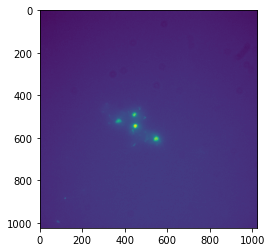

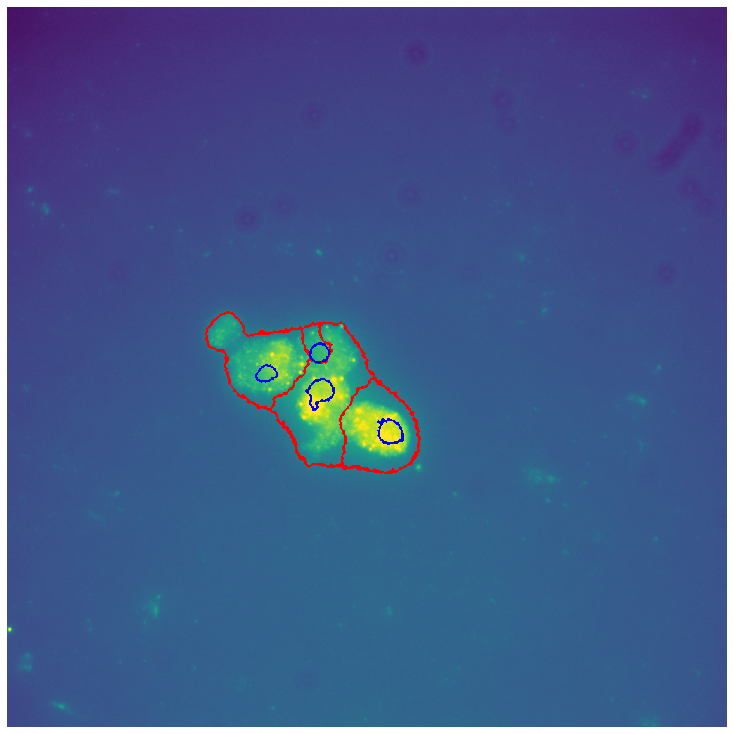

4


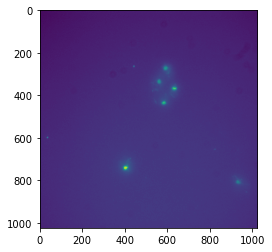

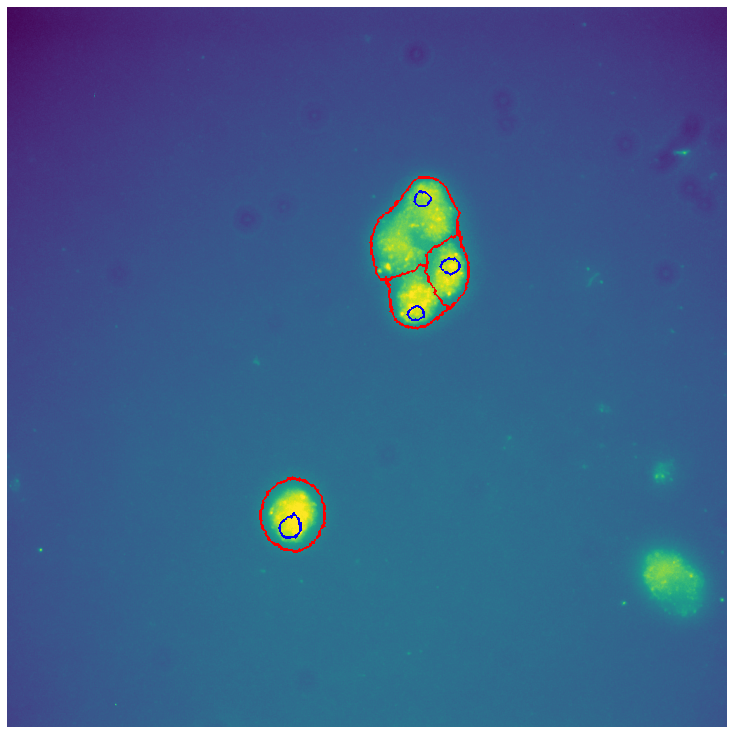

5


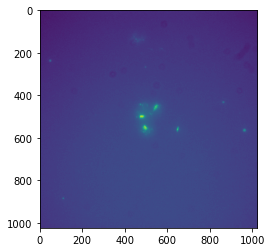

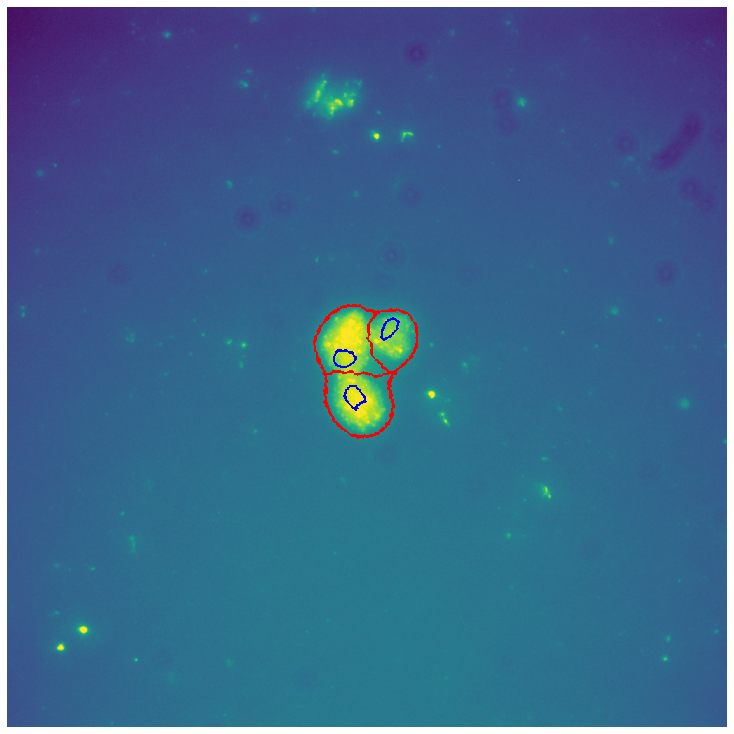

6


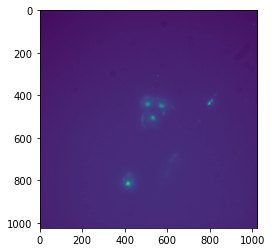

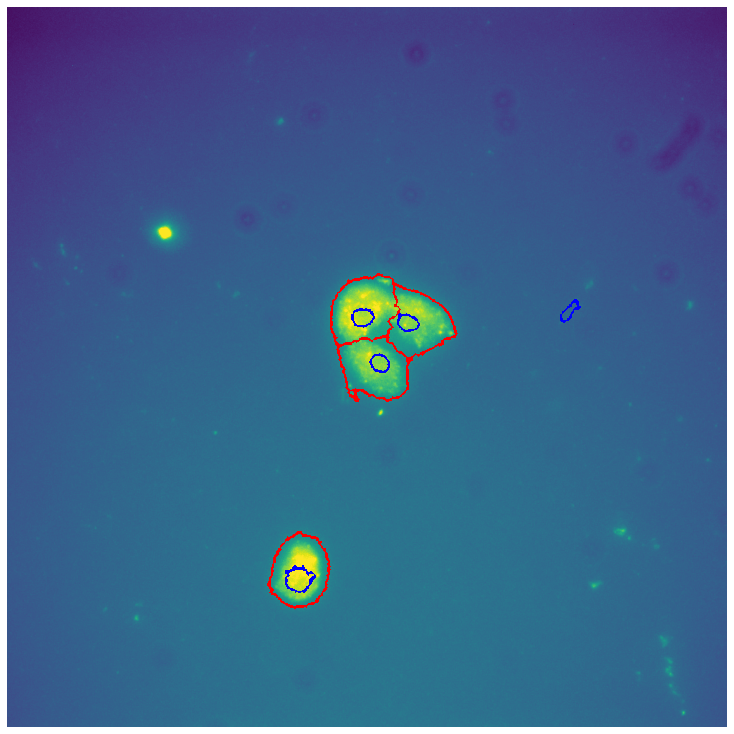

7


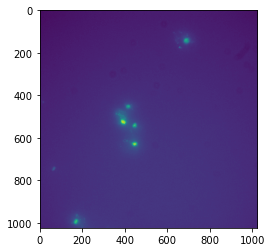

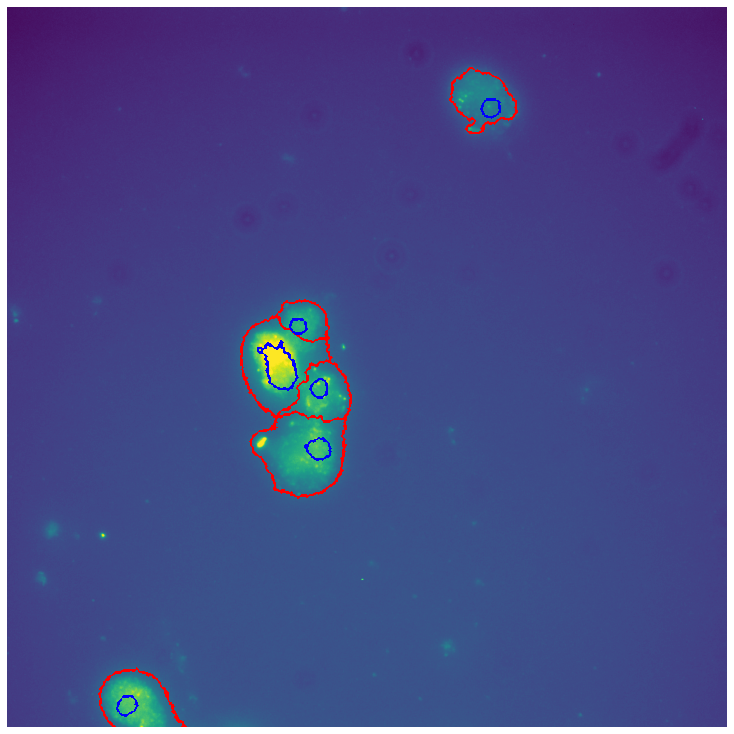

8


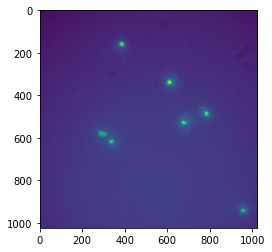

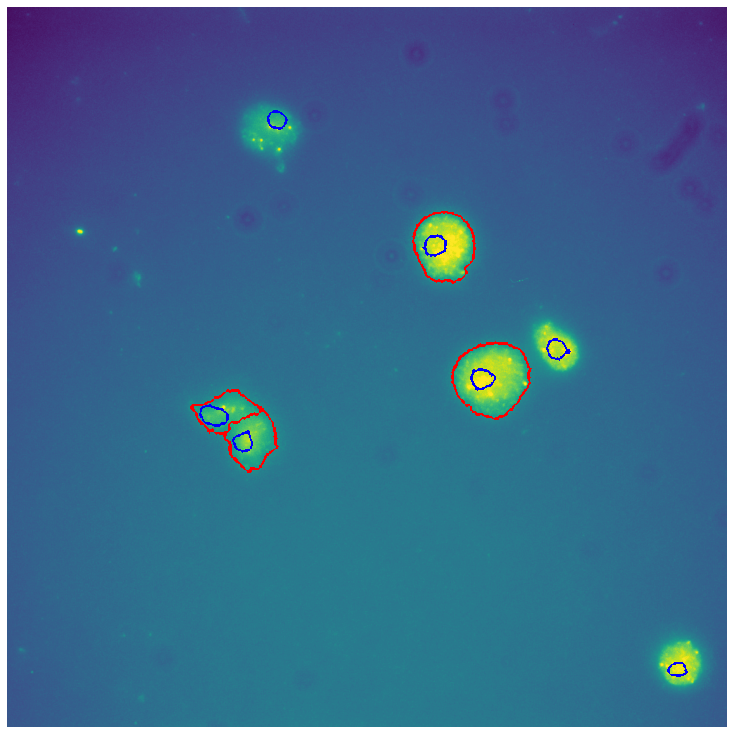

9


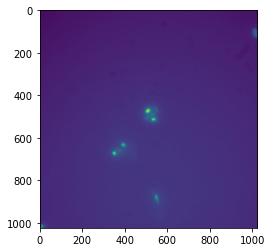

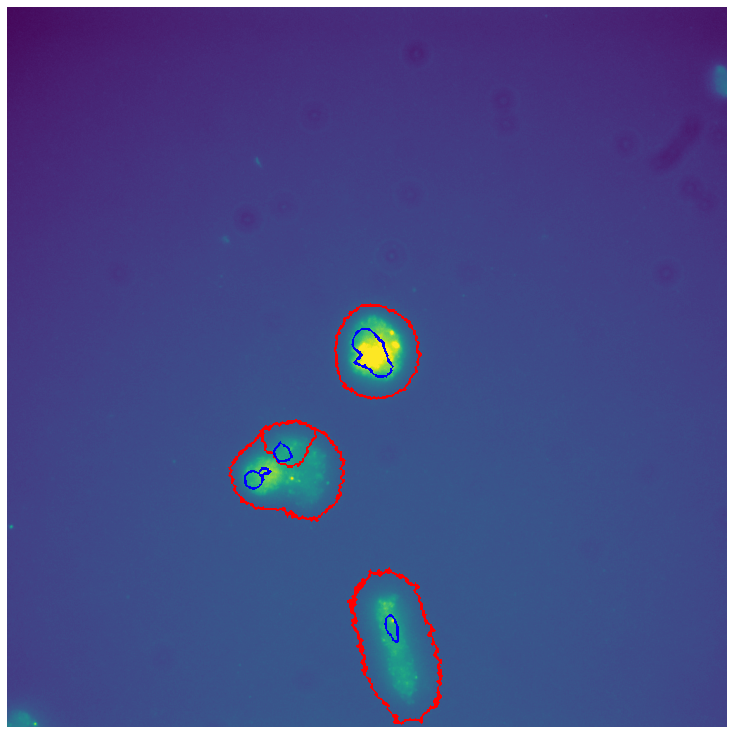

In [9]:
### Segmenting dapi and rna using calculated thresholds 

for i in range(len(rna)):
    
    nuc_2d = stack.maximum_projection(dapi[i])
    rna_2d = stack.maximum_projection(rna[i])        


    # thresholding
    t_nuc = s.mode(nuc_2d.ravel())+4*np.std(dapi[i].ravel())                                     # Using mode + 4*std
    nuc_mask = segmentation.thresholding(nuc_2d, threshold=int(t_nuc))
    nuc_mask = segmentation.clean_segmentation(nuc_mask, small_object_size=300, fill_holes=True)

    # labeling
    nuc_label = segmentation.label_instances(nuc_mask)
    stack.save_image(nuc_label, os.path.join(out_path+"/nucLabel", str(i).zfill(2)+"_nuc_label"))
    
    # apply watershed
    t_rna = s.mode(rna_2d.ravel())+np.std(rna[i].ravel())                                        # Using mode + std
    cell_label = segmentation.cell_watershed(rna_2d, nuc_label, threshold=int(t_rna), alpha=0.9)
    stack.save_image(cell_label, os.path.join(out_path+"/cellLabel", str(i).zfill(2)+"_cell_label"))

    print(i)
    plt.imshow(nuc_2d)
    plot.plot_segmentation_boundary(rna_2d, cell_label, nuc_label, contrast=True, boundary_size=2)  #boundary_size = thickness
    

### in save_image(): Using zfill(2) so that files are saved as 00, 01, 02,... instead of 0, 1, 2. Helps later with sorting.

### Why Mode + 4 * std and Mode + std? Ran segmentation individually for all files. Found a range of best threshold. Noticed a relation between it and mode. Later found out there's a better relation with Mode+2*Std. Tried different constants to be multiplied with Std. 4 worked best for dapi and 1 for rna.

##### Read segmentation results (Currently only the last image's segmentation result is stored. Can be fixed if I create a list in the above cell and append the results. Maybe later. For now let's just run this)

In [11]:
sp = os.listdir(out_path+"/spots")
sp.sort(reverse=True)
sp = sp[0:len(rna)] # To get rid of .DS_Store file
sp.sort()

cl = os.listdir(out_path+"/cellLabel")
cl.sort()

nl = os.listdir(out_path+"/nucLabel")
nl.sort()


spots = []
cell_label = []
nuc_label = []

for i in range(len(rna)):
        spots.append(stack.read_array(os.path.join(out_path+"/spots", sp[i])))
        cell_label.append(stack.read_image(os.path.join(out_path+"/cellLabel", cl[i])))
        nuc_label.append(stack.read_image(os.path.join(out_path+"/nucLabel", nl[i])))

##### Extract cells information for one image (to test)

number of cells identified: 5


cell 0
 number of rna 13


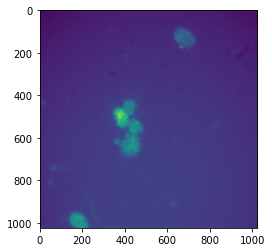

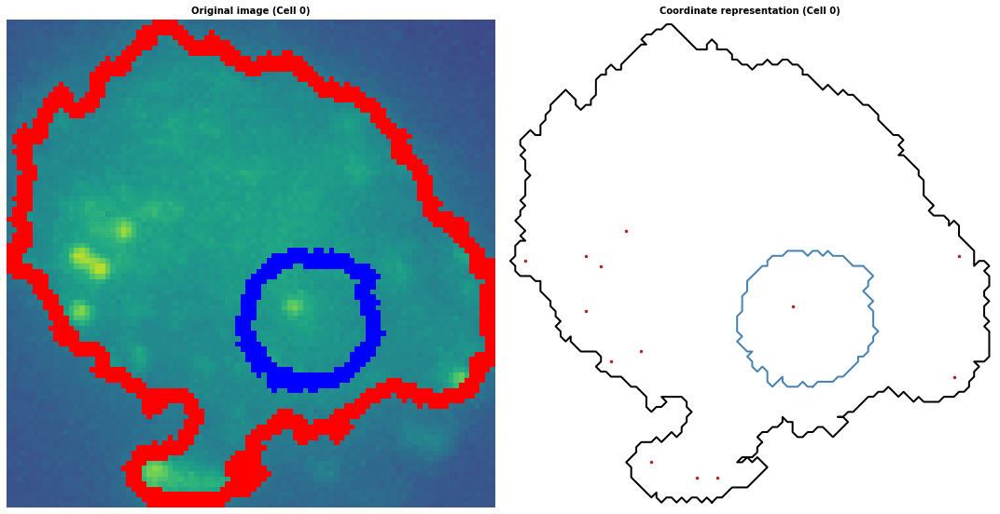

cell 1
 number of rna 2


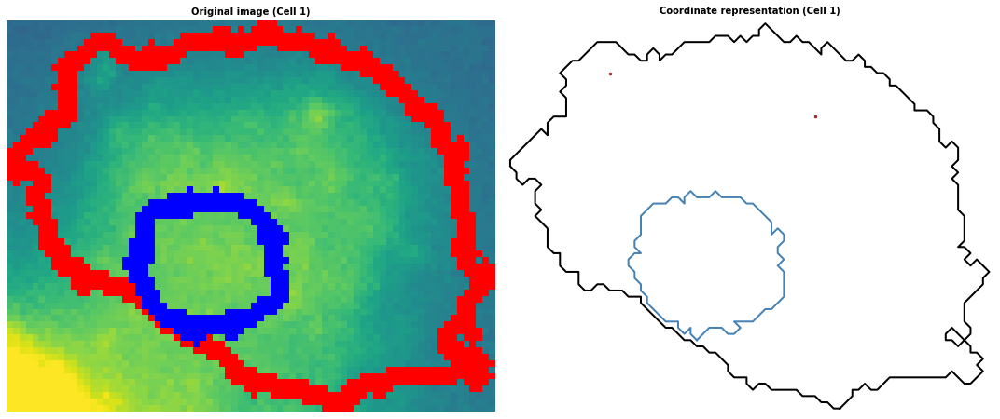

cell 2
 number of rna 34


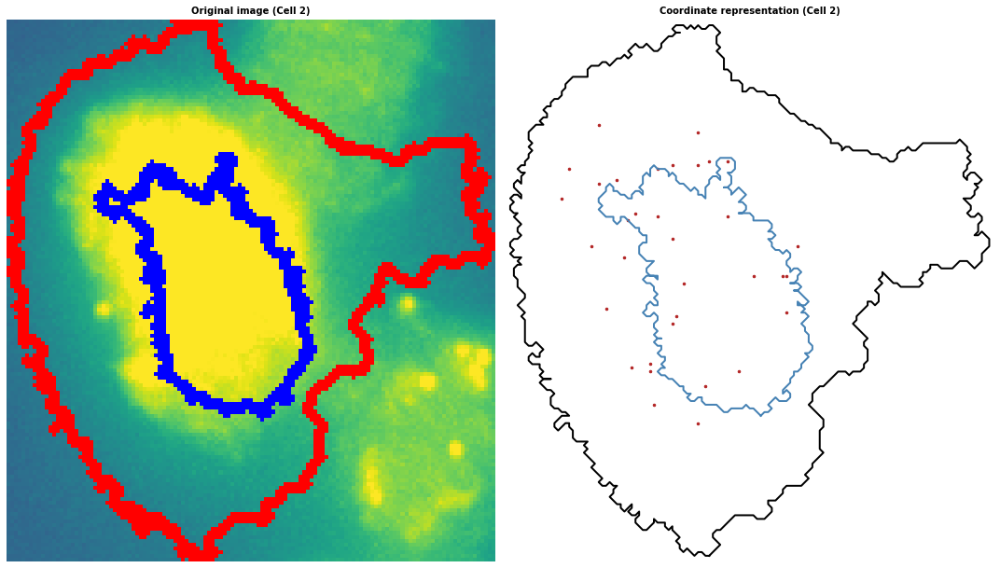

cell 3
 number of rna 15


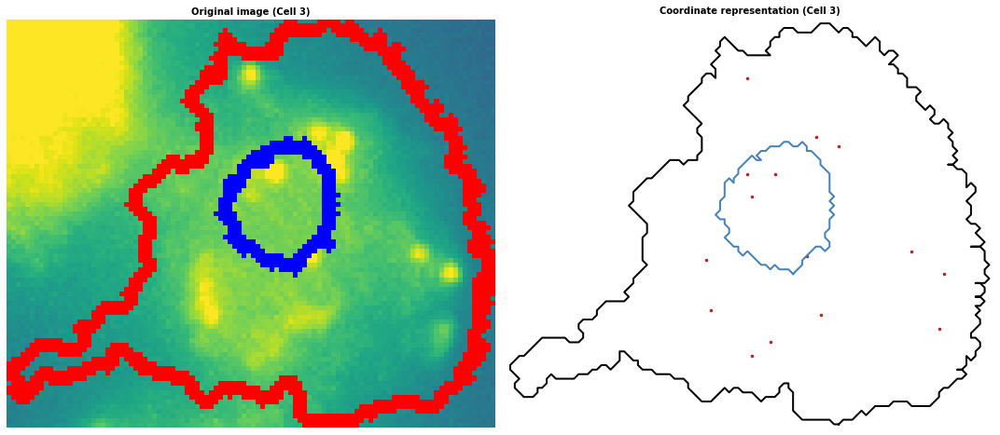

cell 4
 number of rna 23


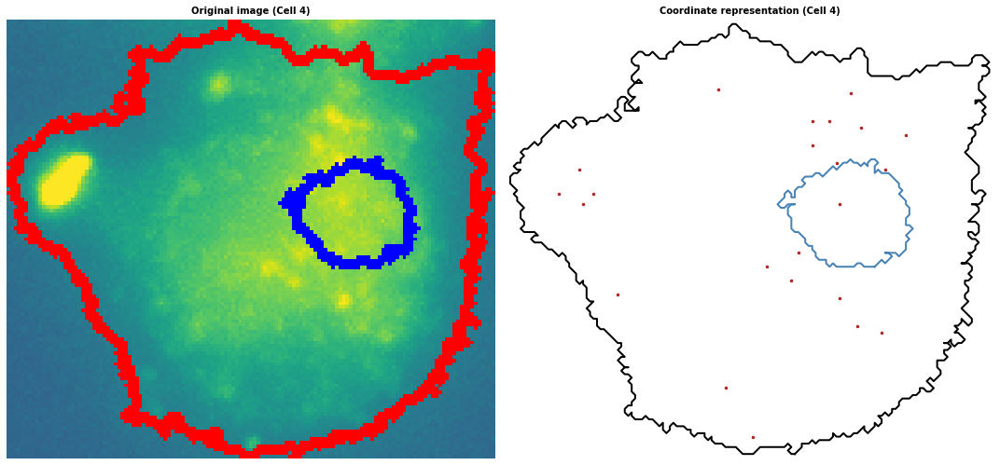

In [12]:
file_num = 7

plt.imshow(rna[file_num][12])       # Displaying the image used to check how accurate the number of cells detected is

image_contrasted = stack.rescale(rna[file_num], channel_to_stretch=0)
image_contrasted = stack.maximum_projection(image_contrasted)
rna_mip = stack.maximum_projection(rna[file_num])
nuc_mip = stack.maximum_projection(dapi[file_num])


fov_results = multistack.extract_cell(
    cell_label=cell_label[file_num], 
    ndim=3,
    nuc_label=nuc_label[file_num], 
    rna_coord=spots[file_num],
    image=image_contrasted,
    others_image={"dapi": nuc_mip, "smfish": rna_mip})
print("number of cells identified: {0}\n\n".format(len(fov_results)))

for n, cell_results in enumerate(fov_results):
    print("cell {0}".format(n))
    
    # get cell results
    cell_mask = cell_results["cell_mask"]
    cell_coord = cell_results["cell_coord"]
    nuc_mask = cell_results["nuc_mask"]
    nuc_coord = cell_results["nuc_coord"]
    rna_coord = cell_results["rna_coord"]
    image_contrasted = cell_results["image"]
    print("\r number of rna {0}".format(len(rna_coord)))
    
    # plot cell
    plot.plot_cell(
        ndim=3, cell_coord=cell_coord, nuc_coord=nuc_coord, rna_coord=rna_coord, 
        image=image_contrasted, cell_mask=cell_mask, nuc_mask=nuc_mask, 
        title="Cell {0}".format(n))

##### Get fov results for all images and save

In [ ]:
fov = []

for i in range(len(rna)):
    image_contrasted = stack.rescale(rna[i], channel_to_stretch=0)
    image_contrasted = stack.maximum_projection(image_contrasted)
    rna_mip = stack.maximum_projection(rna[i])
    nuc_mip = stack.maximum_projection(dapi[i])

    fov_results = multistack.extract_cell(
        cell_label=cell_label[i], 
        ndim=3,
        nuc_label=nuc_label[i], 
        rna_coord=spots[i],
        image=image_contrasted,
        others_image={"dapi": nuc_mip, "smfish": rna_mip})
    
    print("Number of cells identified: {0}".format(len(fov_results)))
    
    fov.append(fov_results)


# save results

for m in range(len(rna)):
    for n, cell_results in enumerate(fov[m]):
        path = os.path.join(out_path+"/fov", "fov_{0}_cell_{1}.npz".format(m,n))
        stack.save_cell_extracted(cell_results, path)

##### Analyze coordinates

In [ ]:
# Distance -- Mean/median of distance of rna to the cell or nuc membrane
# Intranuclear -- rna in nuc, out, proportion in nuc
# Protrusion -- ?
# Dispersion -- ?
# Topographic -- Specific cellular subregions || proportion_rna_cell_radius_500_1000 => proportion of RNAs detected between 500nm and 1000nm from the cellular membrane
# Foci -- ?
# Area -- ['proportion_nuc_area', 'cell_area', 'nuc_area', 'cell_area_out_nuc']
# Centrosomal -- Does our data have centrosomes?

In [ ]:
# parse different results files
dataframes = []

fov_files = os.listdir(out_path+"/fov")
fov_files.sort()

for filename in fov_files[1:]:

    # load single cell data
    path = os.path.join(out_path+"/fov", filename)
    data = stack.read_cell_extracted(path)
    cell_mask = data["cell_mask"]
    nuc_mask = data["nuc_mask"]
    rna_coord = data["rna_coord"]
    smfish = data["smfish"]
    
    # compute features
    features, features_names = classification.compute_features(
    cell_mask, nuc_mask, ndim=3, rna_coord=rna_coord,
    smfish=smfish, voxel_size_yx=103,
    centrosome_coord=None,
    compute_distance=True,
    compute_intranuclear=True,
    compute_protrusion=True,
    compute_dispersion=True,
    compute_topography=True,
    compute_foci=False,
    compute_area=True,
    return_names=True)

    # build dataframe
    features = features.reshape((1, -1))
    df_cell = pd.DataFrame(data=features, columns=features_names)
    dataframes.append(df_cell)
    
# concatenate dataframes
df = pd.concat(dataframes)

# reset index
df.reset_index(drop=True, inplace=True)
df

##### Save

In [ ]:
path = os.path.join(out_path, "df_features.csv")
stack.save_data_to_csv(df, path)

# Analysis

In [13]:
### Concatenating all df_features.csv files into one big dataframe
### Adding 'total_rna' because it is mainly what our project is concerned with
### Also adding 'Gene' and 'Date' features to be able to differentiate

df = []
gene = []
date = []

for i in range(len(folders)):
    csv = pd.read_csv((os.path.join("/Users/bilalsyed/FISH/output",folders[i],"df_features.csv")), sep=";", header=0)
    df.append(csv)
    for n in range(len(csv)):
        gene.append((folders[i].rsplit("_")[1]).rsplit("-")[0])
        date.append(folders[i].rsplit("_")[2])

df = pd.concat(df, axis=0, ignore_index=True)
df['total_rna'] = df['nb_rna_out_nuc']+df['nb_rna_in_nuc']
df['Gene'] = gene
df['Date'] = date

In [14]:
df

,index_mean_distance_cell,index_median_distance_cell,index_mean_distance_nuc,index_median_distance_nuc,proportion_rna_in_nuc,nb_rna_out_nuc,nb_rna_in_nuc,index_rna_protrusion,proportion_rna_protrusion,protrusion_area,...,proportion_rna_cell_radius_2000_2500,index_rna_cell_radius_2500_3000,proportion_rna_cell_radius_2500_3000,proportion_nuc_area,cell_area,nuc_area,cell_area_out_nuc,total_rna,Gene,Date
0,1.13,1.25,0.83,1.06,0.19,13.0,3.0,0.40,0.12,2126.0,...,0.12,0.00,0.00,0.12,6747.0,817.0,5930.0,16.0,Atp4,20april
1,1.18,1.21,0.80,0.60,0.21,15.0,4.0,0.00,0.00,402.0,...,0.05,1.76,0.11,0.17,6529.0,1095.0,5434.0,19.0,Atp4,20april
2,1.63,1.81,0.40,0.24,0.42,7.0,5.0,0.00,0.00,338.0,...,0.25,0.00,0.00,0.21,5509.0,1174.0,4335.0,12.0,Atp4,20april
3,1.31,1.28,0.55,0.19,0.35,11.0,6.0,0.00,0.00,561.0,...,0.06,2.02,0.12,0.17,5700.0,986.0,4714.0,17.0,Atp4,20april
4,1.28,1.39,0.83,0.95,0.11,17.0,2.0,0.00,0.00,357.0,...,0.26,1.53,0.11,0.10,5823.0,582.0,5241.0,19.0,Atp4,20april
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1727,0.86,1.07,1.13,1.25,0.09,20.0,2.0,1.55,0.27,1361.0,...,0.18,0.69,0.05,0.09,7737.0,714.0,7023.0,22.0,Ura4,22april
1728,1.32,1.57,0.25,0.12,0.50,2.0,2.0,0.00,0.00,1044.0,...,0.00,0.00,0.00,0.08,6757.0,570.0,6187.0,4.0,Ura4,22april
1729,1.06,1.20,1.04,1.15,0.07,14.0,1.0,0.75,0.13,1372.0,...,0.13,0.87,0.07,0.06,7684.0,474.0,7210.0,15.0,Ura4,22april
1730,0.73,0.92,0.93,1.07,0.00,6.0,0.0,1.17,0.17,1099.0,...,0.00,2.45,0.17,0.12,7738.0,949.0,6789.0,6.0,Ura4,22april


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1732 entries, 0 to 1731
Data columns (total 44 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   index_mean_distance_cell              1732 non-null   float64
 1   index_median_distance_cell            1732 non-null   float64
 2   index_mean_distance_nuc               1732 non-null   float64
 3   index_median_distance_nuc             1729 non-null   float64
 4   proportion_rna_in_nuc                 1732 non-null   float64
 5   nb_rna_out_nuc                        1732 non-null   float64
 6   nb_rna_in_nuc                         1732 non-null   float64
 7   index_rna_protrusion                  1732 non-null   float64
 8   proportion_rna_protrusion             1732 non-null   float64
 9   protrusion_area                       1732 non-null   float64
 10  index_polarization                    1732 non-null   float64
 11  index_dispersion 

In [16]:
df['total_rna'].describe(percentiles=[.95])

### Mean is ~14. 95% is 37. That shows at least 95% of the results are good
### Max is 355 which must be from the clusters. It also could mean there must be cells that have been merged due to the segmentation threshold being slightly low

count    1732.000000
mean       13.685912
std        21.902166
min         0.000000
50%         9.000000
95%        37.450000
max       355.000000
Name: total_rna, dtype: float64

In [18]:
### Number of cells detected for each gene

df['Gene'].value_counts()

Gcv3     537
Atp4     476
Tim17    262
Hms2     238
Ura4     219
Name: Gene, dtype: int64

In [19]:
print(df['nb_rna_in_nuc'].corr(df['nuc_area']))
print(df['nb_rna_out_nuc'].corr(df['cell_area_out_nuc']))
print(df['total_rna'].corr(df['cell_area']))

### Had expected all of them to be at least 0.7. Area increase = rna count increase. But it seems that's not the case

0.4804239197311581
0.18461630866183187
0.23100274588455852


In [20]:
df.corr()["total_rna"].sort_values(ascending=False)

### Area appears to be the main determinant apparently

total_rna                               1.000000
nb_rna_out_nuc                          0.977628
nb_rna_in_nuc                           0.865646
cell_area                               0.231003
nuc_area                                0.225811
cell_area_out_nuc                       0.210046
index_dispersion                        0.148993
proportion_rna_in_nuc                   0.079620
index_rna_cell_radius_0_500             0.065257
index_rna_nuc_edge                      0.058243
proportion_nuc_area                     0.048232
index_mean_distance_cell                0.042641
index_rna_nuc_radius_500_1000           0.040638
proportion_rna_cell_radius_2500_3000    0.039384
proportion_rna_cell_radius_0_500        0.037903
index_median_distance_cell              0.029295
index_rna_nuc_radius_1000_1500          0.026453
proportion_rna_nuc_edge                 0.023193
proportion_rna_nuc_radius_500_1000      0.018607
index_rna_nuc_radius_1500_2000          0.015995
index_rna_nuc_radius

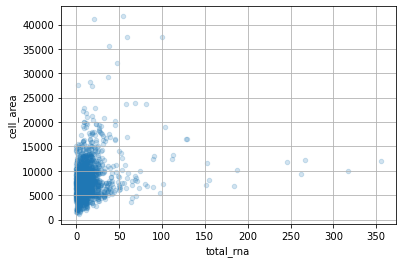

In [21]:
df.plot(kind="scatter", x="total_rna", y="cell_area", grid=True, alpha=0.2)
plt.show()

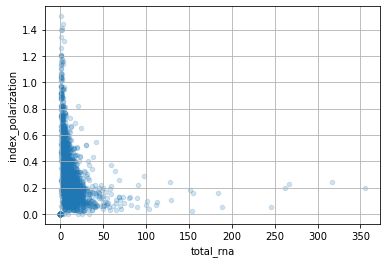

In [22]:
df.plot(kind="scatter", x="total_rna", y="index_polarization", grid=True, alpha=0.2)
plt.show()

# Tests

### Tukey

In [83]:
def tukey3(data):
    q1 = np.quantile(data,0.25)
    q3 = np.quantile(data,0.75)

    k1_5 = q3 + 1.5*(q3-q1)
    print("\nUpper bound for k = 1.5: "+str(k1_5))
    k3 = q3 + 3*(q3-q1)
    print("Upper bound for k = 3: "+str(k3))

    outliers1_5 = sum(data>k1_5)
    print("\nNo. of outliers for k = 1.5: "+str(outliers1_5))
    outliers3 = sum(data>k3)
    print("No. of outliers for k = 3: "+str(outliers3))

In [25]:
atp_rna = []
dates = df['Date'].loc[df['Gene'] == 'Atp4'].unique()

for d in dates:
    atp_rna.append(df['total_rna'].loc[(df['Gene'] == 'Atp4') & (df['Date'] == d)])
    
    
    
gcv_rna = []
dates = df['Date'].loc[df['Gene'] == 'Gcv3'].unique()

for d in dates:
    gcv_rna.append(df['total_rna'].loc[(df['Gene'] == 'Gcv3') & (df['Date'] == d)])

    

hms_rna = []
dates = df['Date'].loc[df['Gene'] == 'Hms2'].unique()

for d in dates:
    hms_rna.append(df['total_rna'].loc[(df['Gene'] == 'Hms2') & (df['Date'] == d)])
    
    
    
tim_rna = []
dates = df['Date'].loc[df['Gene'] == 'Tim17'].unique()

for d in dates:
    tim_rna.append(df['total_rna'].loc[(df['Gene'] == 'Tim17') & (df['Date'] == d)])
    

    
ura_rna = []
dates = df['Date'].loc[df['Gene'] == 'Ura4'].unique()

for d in dates:
    ura_rna.append(df['total_rna'].loc[(df['Gene'] == 'Ura4') & (df['Date'] == d)])

    
    

all_rna = []
for g in df['Gene'].unique():
    all_rna.append(df['total_rna'].loc[(df['Gene'] == g)])

In [84]:
for i in range(len(atp_rna)):
    tukey3(atp_rna[i])


Upper bound for k = 1.5: 31.0
Upper bound for k = 3: 43.0

No. of outliers for k = 1.5: 9
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 24.5
Upper bound for k = 3: 35.0

No. of outliers for k = 1.5: 4
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 32.5
Upper bound for k = 3: 46.0

No. of outliers for k = 1.5: 5
No. of outliers for k = 3: 3

Upper bound for k = 1.5: 32.5
Upper bound for k = 3: 49.0

No. of outliers for k = 1.5: 8
No. of outliers for k = 3: 6


In [56]:
for i in range(len(gcv_rna)):
    tukey3(gcv_rna[i])


Upper bound for k = 1.5: 64.25
Upper bound for k = 3: 98.0

No. of outliers for k = 1.5: 11
No. of outliers for k = 3: 4

Upper bound for k = 1.5: 17.375
Upper bound for k = 3: 26.0

No. of outliers for k = 1.5: 3
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 8.5
Upper bound for k = 3: 13.0

No. of outliers for k = 1.5: 26
No. of outliers for k = 3: 25

Upper bound for k = 1.5: 166.25
Upper bound for k = 3: 260.0

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 4

Upper bound for k = 1.5: 22.75
Upper bound for k = 3: 34.0

No. of outliers for k = 1.5: 3
No. of outliers for k = 3: 2


In [57]:
for i in range(len(hms_rna)):
    tukey3(hms_rna[i])


Upper bound for k = 1.5: 41.5
Upper bound for k = 3: 61.0

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 3

Upper bound for k = 1.5: 53.0
Upper bound for k = 3: 77.0

No. of outliers for k = 1.5: 1
No. of outliers for k = 3: 0


In [58]:
for i in range(len(tim_rna)):
    tukey3(tim_rna[i])


Upper bound for k = 1.5: 14.0
Upper bound for k = 3: 20.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 10.5
Upper bound for k = 3: 15.0

No. of outliers for k = 1.5: 0
No. of outliers for k = 3: 0

Upper bound for k = 1.5: 13.75
Upper bound for k = 3: 20.5

No. of outliers for k = 1.5: 0
No. of outliers for k = 3: 0


In [59]:
for i in range(len(ura_rna)):
    tukey3(ura_rna[i])


Upper bound for k = 1.5: 37.5
Upper bound for k = 3: 54.0

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 21.0
Upper bound for k = 3: 30.0

No. of outliers for k = 1.5: 8
No. of outliers for k = 3: 1


In [60]:
for i in range(len(all_rna)):
    tukey3(all_rna[i])


Upper bound for k = 1.5: 30.5
Upper bound for k = 3: 44.0

No. of outliers for k = 1.5: 27
No. of outliers for k = 3: 12

Upper bound for k = 1.5: 22.0
Upper bound for k = 3: 34.0

No. of outliers for k = 1.5: 61
No. of outliers for k = 3: 47

Upper bound for k = 1.5: 48.5
Upper bound for k = 3: 71.0

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 15.5
Upper bound for k = 3: 23.0

No. of outliers for k = 1.5: 5
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 30.5
Upper bound for k = 3: 44.0

No. of outliers for k = 1.5: 10
No. of outliers for k = 3: 5


In [82]:
for i in range(len(all_rna)):
    print(len(remove_tukey(all_rna[i]))*100/len(all_rna[i]))
    
print(len(remove_tukey(df['total_rna']))*100/len(df['total_rna']))

94.32773109243698
88.64059590316573
97.05882352941177
98.09160305343511
95.4337899543379
93.82217090069284


In [28]:
atp_nuc = []
dates = df['Date'].loc[df['Gene'] == 'Atp4'].unique()

for d in dates:
    atp_nuc.append(df['nuc_area'].loc[(df['Gene'] == 'Atp4') & (df['Date'] == d)])
    
    
    
gcv_nuc = []
dates = df['Date'].loc[df['Gene'] == 'Gcv3'].unique()

for d in dates:
    gcv_nuc.append(df['nuc_area'].loc[(df['Gene'] == 'Gcv3') & (df['Date'] == d)])

    

hms_nuc = []
dates = df['Date'].loc[df['Gene'] == 'Hms2'].unique()

for d in dates:
    hms_nuc.append(df['nuc_area'].loc[(df['Gene'] == 'Hms2') & (df['Date'] == d)])
    
    
    
tim_nuc = []
dates = df['Date'].loc[df['Gene'] == 'Tim17'].unique()

for d in dates:
    tim_nuc.append(df['nuc_area'].loc[(df['Gene'] == 'Tim17') & (df['Date'] == d)])
    

    
ura_nuc = []
dates = df['Date'].loc[df['Gene'] == 'Ura4'].unique()

for d in dates:
    ura_nuc.append(df['nuc_area'].loc[(df['Gene'] == 'Ura4') & (df['Date'] == d)])
    
    

all_nuc = []
for g in df['Gene'].unique():
    all_nuc.append(df['nuc_area'].loc[(df['Gene'] == g)])

In [29]:
for i in range(len(atp_nuc)):
    tukey3(atp_nuc[i])


Upper bound for k = 1.5: 1847.5
Upper bound for k = 3: 2665.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 3

Upper bound for k = 1.5: 2033.0
Upper bound for k = 3: 2897.0

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 2840.0
Upper bound for k = 3: 4031.0

No. of outliers for k = 1.5: 14
No. of outliers for k = 3: 9

Upper bound for k = 1.5: 3153.5
Upper bound for k = 3: 4478.0

No. of outliers for k = 1.5: 2
No. of outliers for k = 3: 1


In [30]:
for i in range(len(gcv_nuc)):
    tukey3(gcv_nuc[i])


Upper bound for k = 1.5: 1152.375
Upper bound for k = 3: 1569.75

No. of outliers for k = 1.5: 4
No. of outliers for k = 3: 3

Upper bound for k = 1.5: 1697.75
Upper bound for k = 3: 2389.25

No. of outliers for k = 1.5: 11
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 2007.5
Upper bound for k = 3: 2769.5

No. of outliers for k = 1.5: 16
No. of outliers for k = 3: 7

Upper bound for k = 1.5: 4159.0
Upper bound for k = 3: 5862.25

No. of outliers for k = 1.5: 1
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 3135.75
Upper bound for k = 3: 4531.5

No. of outliers for k = 1.5: 1
No. of outliers for k = 3: 0


In [31]:
for i in range(len(hms_nuc)):
    tukey3(hms_nuc[i])


Upper bound for k = 1.5: 2929.0
Upper bound for k = 3: 4222.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 2226.5
Upper bound for k = 3: 3296.0

No. of outliers for k = 1.5: 4
No. of outliers for k = 3: 2


In [32]:
for i in range(len(tim_nuc)):
    tukey3(tim_nuc[i])


Upper bound for k = 1.5: 1181.625
Upper bound for k = 3: 1610.25

No. of outliers for k = 1.5: 13
No. of outliers for k = 3: 6

Upper bound for k = 1.5: 1341.0
Upper bound for k = 3: 1863.0

No. of outliers for k = 1.5: 4
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 2425.25
Upper bound for k = 3: 3407.0

No. of outliers for k = 1.5: 1
No. of outliers for k = 3: 1


In [33]:
for i in range(len(ura_nuc)):
    tukey3(ura_nuc[i])


Upper bound for k = 1.5: 2223.625
Upper bound for k = 3: 3307.75

No. of outliers for k = 1.5: 9
No. of outliers for k = 3: 5

Upper bound for k = 1.5: 1266.75
Upper bound for k = 3: 1731.0

No. of outliers for k = 1.5: 3
No. of outliers for k = 3: 0


In [34]:
for i in range(len(all_nuc)):
    tukey3(all_nuc[i])


Upper bound for k = 1.5: 2255.75
Upper bound for k = 3: 3218.75

No. of outliers for k = 1.5: 42
No. of outliers for k = 3: 16

Upper bound for k = 1.5: 2133.5
Upper bound for k = 3: 3041.0

No. of outliers for k = 1.5: 40
No. of outliers for k = 3: 12

Upper bound for k = 1.5: 2573.0
Upper bound for k = 3: 3725.75

No. of outliers for k = 1.5: 9
No. of outliers for k = 3: 5

Upper bound for k = 1.5: 1479.5
Upper bound for k = 3: 2072.75

No. of outliers for k = 1.5: 19
No. of outliers for k = 3: 11

Upper bound for k = 1.5: 1796.5
Upper bound for k = 3: 2606.5

No. of outliers for k = 1.5: 14
No. of outliers for k = 3: 7


In [81]:
for i in range(len(all_nuc)):
    print(len(remove_tukey(all_nuc[i]))*100/len(all_nuc[i]))
    
print(len(remove_tukey(df['nuc_area']))*100/len(df['nuc_area']))

91.17647058823529
92.5512104283054
96.21848739495799
92.74809160305344
93.60730593607306
93.0715935334873


In [35]:
atp_cell = []
dates = df['Date'].loc[df['Gene'] == 'Atp4'].unique()

for d in dates:
    atp_cell.append(df['cell_area'].loc[(df['Gene'] == 'Atp4') & (df['Date'] == d)])
    
    
    
gcv_cell = []
dates = df['Date'].loc[df['Gene'] == 'Gcv3'].unique()

for d in dates:
    gcv_cell.append(df['cell_area'].loc[(df['Gene'] == 'Gcv3') & (df['Date'] == d)])

    

hms_cell = []
dates = df['Date'].loc[df['Gene'] == 'Hms2'].unique()

for d in dates:
    hms_cell.append(df['cell_area'].loc[(df['Gene'] == 'Hms2') & (df['Date'] == d)])
    
    
    
tim_cell = []
dates = df['Date'].loc[df['Gene'] == 'Tim17'].unique()

for d in dates:
    tim_cell.append(df['cell_area'].loc[(df['Gene'] == 'Tim17') & (df['Date'] == d)])
    

    
ura_cell = []
dates = df['Date'].loc[df['Gene'] == 'Ura4'].unique()

for d in dates:
    ura_cell.append(df['cell_area'].loc[(df['Gene'] == 'Ura4') & (df['Date'] == d)])

    
    

all_cell = []
for g in df['Gene'].unique():
    all_cell.append(df['cell_area'].loc[(df['Gene'] == g)])

In [36]:
for i in range(len(atp_cell)):
    tukey3(atp_cell[i])


Upper bound for k = 1.5: 13476.5
Upper bound for k = 3: 18305.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 16294.5
Upper bound for k = 3: 22722.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 16534.5
Upper bound for k = 3: 22488.0

No. of outliers for k = 1.5: 15
No. of outliers for k = 3: 4

Upper bound for k = 1.5: 20992.0
Upper bound for k = 3: 28762.0

No. of outliers for k = 1.5: 2
No. of outliers for k = 3: 0


In [37]:
for i in range(len(gcv_cell)):
    tukey3(gcv_cell[i])


Upper bound for k = 1.5: 20406.625
Upper bound for k = 3: 29654.5

No. of outliers for k = 1.5: 0
No. of outliers for k = 3: 0

Upper bound for k = 1.5: 14052.25
Upper bound for k = 3: 19358.5

No. of outliers for k = 1.5: 10
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 12333.875
Upper bound for k = 3: 16298.0

No. of outliers for k = 1.5: 12
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 23680.0
Upper bound for k = 3: 32515.75

No. of outliers for k = 1.5: 2
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 11979.0
Upper bound for k = 3: 15913.5

No. of outliers for k = 1.5: 1
No. of outliers for k = 3: 0


In [38]:
for i in range(len(hms_cell)):
    tukey3(hms_cell[i])


Upper bound for k = 1.5: 15228.0
Upper bound for k = 3: 20724.0

No. of outliers for k = 1.5: 5
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 12287.0
Upper bound for k = 3: 16619.0

No. of outliers for k = 1.5: 6
No. of outliers for k = 3: 1


In [39]:
for i in range(len(tim_cell)):
    tukey3(tim_cell[i])


Upper bound for k = 1.5: 12862.75
Upper bound for k = 3: 17355.25

No. of outliers for k = 1.5: 3
No. of outliers for k = 3: 1

Upper bound for k = 1.5: 13970.5
Upper bound for k = 3: 19204.0

No. of outliers for k = 1.5: 2
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 19178.75
Upper bound for k = 3: 27104.0

No. of outliers for k = 1.5: 2
No. of outliers for k = 3: 0


In [40]:
for i in range(len(ura_cell)):
    tukey3(ura_cell[i])


Upper bound for k = 1.5: 12716.625
Upper bound for k = 3: 18010.5

No. of outliers for k = 1.5: 5
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 14769.0
Upper bound for k = 3: 19936.5

No. of outliers for k = 1.5: 4
No. of outliers for k = 3: 1


In [41]:
for i in range(len(all_cell)):
    tukey3(all_cell[i])


Upper bound for k = 1.5: 17400.25
Upper bound for k = 3: 24317.5

No. of outliers for k = 1.5: 26
No. of outliers for k = 3: 6

Upper bound for k = 1.5: 14704.0
Upper bound for k = 3: 20221.0

No. of outliers for k = 1.5: 25
No. of outliers for k = 3: 4

Upper bound for k = 1.5: 14755.375
Upper bound for k = 3: 20240.5

No. of outliers for k = 1.5: 7
No. of outliers for k = 3: 2

Upper bound for k = 1.5: 14175.25
Upper bound for k = 3: 19480.75

No. of outliers for k = 1.5: 8
No. of outliers for k = 3: 5

Upper bound for k = 1.5: 13749.5
Upper bound for k = 3: 19163.0

No. of outliers for k = 1.5: 12
No. of outliers for k = 3: 3


In [80]:
for i in range(len(all_cell)):
    print(len(remove_tukey(all_cell[i]))*100/len(all_cell[i]))
    
print(len(remove_tukey(df['cell_area']))*100/len(df['cell_area']))

94.53781512605042
95.34450651769087
97.05882352941177
96.94656488549619
94.52054794520548
95.3810623556582


## Kolmogorov–Smirnov test

In [42]:
def remove_tukey(data):
    q1 = np.quantile(data,0.25)
    q3 = np.quantile(data,0.75)
    k = q3 + 1.5*(q3-q1)
    return data[data<k]

In [43]:
def kstest_total_rna(df, gene, c=0):  # c = 1 means use remove_tukey()
    gene_rna = []
    dates = df['Date'].loc[df['Gene'] == gene].unique()
    for d in dates:
        gene_rna.append(df['total_rna'].loc[(df['Gene'] == gene) & (df['Date'] == d)])
    
    if c==0:
        for d in gene_rna:                     
            print("p-value: "+str(stats.kstest(d, 'poisson', args=(d.mean(),0))[1]))
    
    if c==1:
        for d in gene_rna:                     
            print("p-value: "+str(stats.kstest(remove_tukey(d), 'poisson', args=(remove_tukey(d).mean(),0))[1]))

In [44]:
for g in df['Gene'].unique():
    print("\n------------ "+g+" ------------")
    kstest_total_rna(df, g)


------------ Atp4 ------------
p-value: 0.001921764375863727
p-value: 0.002175226381264433
p-value: 4.7562856089053274e-06
p-value: 1.4469987906671645e-17

------------ Gcv3 ------------
p-value: 2.4175625761746545e-21
p-value: 8.787037970751023e-08
p-value: 1.348522055359292e-91
p-value: 6.567513933072434e-22
p-value: 6.953382890349289e-07

------------ Hms2 ------------
p-value: 7.953415739118811e-11
p-value: 2.6635769491653012e-05

------------ Tim17 ------------
p-value: 0.013997563899296428
p-value: 0.00076466256861033
p-value: 0.04374840421390758

------------ Ura4 ------------
p-value: 4.913139229266097e-08
p-value: 0.0008695170042629266


In [45]:
for g in df['Gene'].unique():
    print("\n------------ "+g+" ------------")
    kstest_total_rna(df, g,1)


------------ Atp4 ------------
p-value: 0.03836931837952497
p-value: 0.0018093909977500964
p-value: 0.0008027516584263104
p-value: 0.0016419701345666837

------------ Gcv3 ------------
p-value: 0.0011994918866455873
p-value: 1.5422957095493613e-06
p-value: 1.7795859818400984e-06
p-value: 1.2394193779903959e-12
p-value: 0.8655702186854807

------------ Hms2 ------------
p-value: 4.3370311744006623e-07
p-value: 3.5288733450155806e-05

------------ Tim17 ------------
p-value: 0.0065044664386295645
p-value: 0.00076466256861033
p-value: 0.04374840421390758

------------ Ura4 ------------
p-value: 0.00040703412974585893
p-value: 0.013383342046660373


In [46]:
def kstest_all(df, c=0):
    all_genes = []

    for g in df['Gene'].unique():
        all_genes.append(df['total_rna'].loc[(df['Gene'] == g)])
    
    if c==0:
        for d in all_genes:
            print("p-value: "+str(stats.kstest(d, 'poisson', args=(d.mean(),0))[1]))
            
    if c==1:
        for d in all_genes:
            print("p-value: "+str(stats.kstest(remove_tukey(d), 'poisson', args=(remove_tukey(d).mean(),0))[1]))

In [47]:
kstest_all(df)

p-value: 3.799571877394688e-27
p-value: 4.010658059294952e-224
p-value: 7.608428807491512e-17
p-value: 3.4113169419477806e-05
p-value: 2.1566965777765263e-13


In [48]:
kstest_all(df,1)

p-value: 3.9064598220104977e-10
p-value: 4.535587205657054e-26
p-value: 4.752461513237091e-12
p-value: 2.60959575839909e-07
p-value: 1.8752376841323546e-06


## MWU Test

In [49]:
def MWU_total_rna(df, gene, c=0):
    gene_rna = []
    dates = df['Date'].loc[df['Gene'] == gene].unique()
    for d in dates:
        gene_rna.append(df['total_rna'].loc[(df['Gene'] == gene) & (df['Date'] == d)])
    
    if c==0:
        for i in range(len(gene_rna)):
            for j in range(len(gene_rna)):
                if(j>i):
                    U1, p = mannwhitneyu(gene_rna[i], gene_rna[j])
                    print(dates[i],dates[j],"\t",p)

    if c==1:
        for i in range(len(gene_rna)):
            for j in range(len(gene_rna)):
                if(j>i):
                    U1, p = mannwhitneyu(remove_tukey(gene_rna[i]), remove_tukey(gene_rna[j]))
                    print(dates[i],dates[j],"\t",p)

In [50]:
for g in df['Gene'].unique():
    print("\n------------ "+g+" ------------")
    MWU_total_rna(df, g)


------------ Atp4 ------------
20april 30June 	 1.2175155524965755e-10
20april 30May 	 0.7352441628321893
20april 31May 	 0.005075336596562605
30June 30May 	 5.249786190055906e-10
30June 31May 	 0.665030521237749
30May 31May 	 0.008232210817441663

------------ Gcv3 ------------
20april 30June 	 2.7198283702896267e-10
20april 30May02 	 2.6711841523156842e-14
20april 31May 	 0.05382505665353707
20april 31May12 	 0.03233879992631514
30June 30May02 	 2.1374797987279213e-14
30June 31May 	 1.1309569192090316e-15
30June 31May12 	 0.1335297784476439
30May02 31May 	 8.424423169271968e-17
30May02 31May12 	 0.00011445162607538291
31May 31May12 	 0.0006159950006554939

------------ Hms2 ------------
10May07 22May07 	 5.653653662363489e-05

------------ Tim17 ------------
06July 22april 	 0.0004189204200915835
06July 31May 	 0.029773112869045968
22april 31May 	 0.6945153389895664

------------ Ura4 ------------
06July 22april 	 5.933075219783578e-08


In [51]:
for g in df['Gene'].unique():
    print("\n------------ "+g+" ------------")
    MWU_total_rna(df, g,1)


------------ Atp4 ------------
20april 30June 	 1.5540313658873188e-09
20april 30May 	 0.754261225151275
20april 31May 	 1.4316985314475987e-05
30June 30May 	 3.666194839896046e-10
30June 31May 	 0.254763004894371
30May 31May 	 7.686671442614491e-06

------------ Gcv3 ------------
20april 30June 	 1.825508736842556e-06
20april 30May02 	 8.498330520001888e-16
20april 31May 	 0.0231200222059814
20april 31May12 	 0.01138425682075829
30June 30May02 	 8.975779059781953e-26
30June 31May 	 9.019075371281214e-13
30June 31May12 	 0.7449746660403456
30May02 31May 	 1.1364043066870594e-19
30May02 31May12 	 1.813088359428545e-05
31May 31May12 	 3.272757062401807e-05

------------ Hms2 ------------
10May07 22May07 	 1.363263145011418e-06

------------ Tim17 ------------
06July 22april 	 0.004307044638521754
06July 31May 	 0.09565673561333059
22april 31May 	 0.6945153389895664

------------ Ura4 ------------
06July 22april 	 3.9996633426600777e-10


In [52]:
def MWU_all(df, c = 0):
    
    all_genes = []

    for g in df['Gene'].unique():
        all_genes.append(df['total_rna'].loc[(df['Gene'] == g)])
    names = df['Gene'].unique()

    if c==0:
        for i in range(len(all_genes)):
            for j in range(len(all_genes)):
                if(j>i):
                    U1, p = mannwhitneyu(all_genes[i], all_genes[j])
                    print(names[i],names[j],"\t",p)
                    
    if c==1:
        for i in range(len(all_genes)):
            for j in range(len(all_genes)):
                if(j>i):
                    U1, p = mannwhitneyu(remove_tukey(all_genes[i]), remove_tukey(all_genes[j]))
                    print(names[i],names[j],"\t",p)

In [53]:
MWU_all(df)

Atp4 Gcv3 	 6.45770923166623e-47
Atp4 Hms2 	 2.0763939277630748e-10
Atp4 Tim17 	 1.7608860544959522e-56
Atp4 Ura4 	 0.22023564591570033
Gcv3 Hms2 	 2.035984120758038e-43
Gcv3 Tim17 	 0.20756211078562592
Gcv3 Ura4 	 2.367381893955027e-26
Hms2 Tim17 	 2.5004651194189302e-54
Hms2 Ura4 	 2.6306279506838726e-09
Tim17 Ura4 	 7.960870105051606e-36


In [54]:
MWU_all(df,1)

Atp4 Gcv3 	 1.2603276701075107e-74
Atp4 Hms2 	 2.1459603562418845e-13
Atp4 Tim17 	 3.1607229458965567e-56
Atp4 Ura4 	 0.28260599964377875
Gcv3 Hms2 	 1.9036672425002017e-68
Gcv3 Tim17 	 9.0339255524812e-05
Gcv3 Ura4 	 1.7410362824615421e-43
Hms2 Tim17 	 6.128751978120742e-55
Hms2 Ura4 	 5.557713670632582e-11
Tim17 Ura4 	 1.0702728001727343e-35
